In [1]:
%matplotlib inline
import pandas as pd
import geopandas as gpd
import libpysal as lp
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import shapely.geometry as geom
import sklearn.metrics as skm

## Point clustering

Work with the point data to find regions where airbnbs colocate

In [2]:
listings = pd.read_csv('berlin-listings.csv.gz')
listings['geometry'] = listings[['longitude', 'latitude']].apply(geom.Point, axis=1)
listings = gpd.GeoDataFrame(listings)
listings.crs = {'init': 'epsg:4269'}
listings = listings.to_crs(epsg=3857)

C:\Users\Ivan\.conda\envs\geopandas_env\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


<AxesSubplot:>

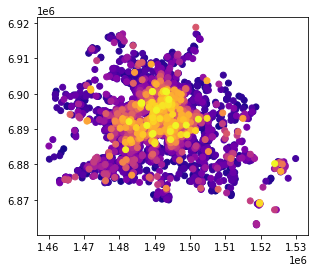

In [3]:
listings.sort_values('price').plot('price', cmap='plasma')

In [4]:
import sklearn.cluster as skc

In [5]:
coordinates = listings['geometry'].apply(lambda p: np.hstack(p.xy)).values
coordinates = np.vstack(coordinates)

Using a local density-based scan clusterer called DBSCAN. It works by fitting clusters of nearby points using the eps distance, which is the furthest distance at which points are considered
to be in each other's clusters, kind of like the distance-band weight.

In [6]:
clusterer = skc.DBSCAN(eps=1000).fit(coordinates)

In [7]:
# clusterer contains all of the observations found to be components of clusters
clusterer.components_

array([[1491246.09061424, 6906289.70588367],
       [1491523.30240249, 6905027.62143263],
       [1491598.86544802, 6907372.95286508],
       ...,
       [1484839.95240176, 6903009.17762691],
       [1486389.18508418, 6903758.10772346],
       [1486722.30038881, 6904230.45907474]])

In [8]:
# clusterer also contains the indices of the observations found to be 'cores' of the clusters detected
clusterer.core_sample_indices_

array([    0,     1,     2, ..., 20047, 20048, 20049], dtype=int64)

In [9]:
# also labels which are the quantity of interest here, the main thing we wanted to detect
clusterer.labels_

array([ 0,  0,  0, ...,  6, -1, -1], dtype=int64)

In [10]:
# the number of discovered clusters is contained in the p attribute
nclusters = clusterer.p 

<AxesSubplot:>

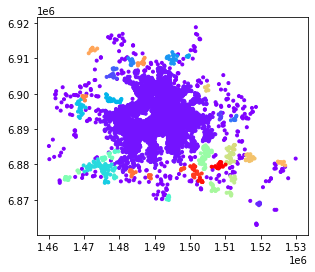

In [13]:
listings.assign(labels=clusterer.labels_).sort_values('labels').plot('labels', k=nclusters, cmap='rainbow', marker='.')

## Areal clusters

In [15]:
district = gpd.read_file('berlin-districts.geojson').to_crs(epsg=3857)

<AxesSubplot:>

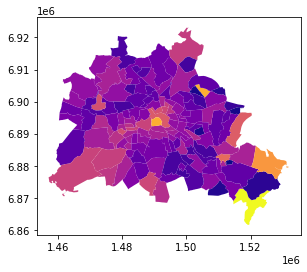

In [16]:
district.plot('median_price', cmap='plasma')

<AxesSubplot:>

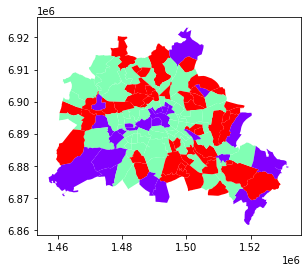

In [18]:
district_priceclusters = skc.AgglomerativeClustering(n_clusters=3).fit(district[['median_price']])
district.assign(labels=district_priceclusters.labels_).plot('labels', cmap='rainbow')
# these are all broken up around the map

In [20]:
# To measure the quality of clusters in the map, we can use the silhouette score, which is a standardized distance between each observation's data and the 'decision boundary'
silhouettes = skm.silhouette_samples(district[['median_price']], district_priceclusters.labels_)

<AxesSubplot:>

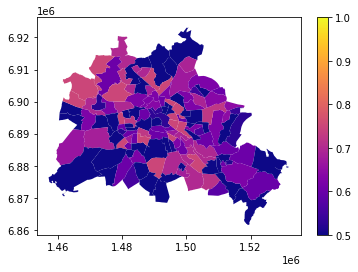

In [22]:
district.assign(strength=silhouettes).plot('strength', cmap='plasma', vmin=.5, vmax=1, legend=True)

In [23]:
import mapclassify as mc

In [24]:
fisher_jenks = mc.FisherJenks(district.median_price, k=3).yb

<AxesSubplot:>

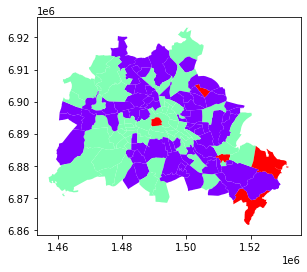

In [25]:
district.assign(labels=fisher_jenks).plot('labels', cmap='rainbow')

In [26]:
silhouettes_fj = skm.silhouette_samples(district[['median_price']], fisher_jenks)

<AxesSubplot:>

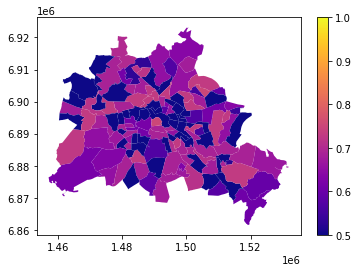

In [27]:
district.assign(strength=silhouettes_fj).plot('strength', cmap='plasma', vmin=.5, vmax=1, legend=True)

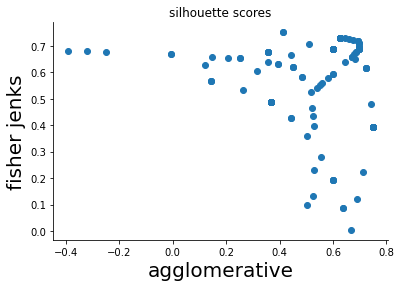

In [28]:
plt.scatter(silhouettes, silhouettes_fj)
plt.xlabel('agglomerative', fontsize=20)
plt.title('silhouette scores')
plt.ylabel('fisher jenks', fontsize=20)
sns.despine()

In [29]:
skm.silhouette_score(district[['median_price']], fisher_jenks)

0.5618749510784694

In [30]:
skm.silhouette_score(district[['median_price']], district_priceclusters.labels_)

# fisher jenks clustering is slightly better than agglomerative clustering

0.5343313272578376

## Contiguous clusters

In [31]:
import libpysal as lp

In [35]:
rook_graph = lp.weights.Rook.from_dataframe(district)
rook_graph.sparse

<138x138 sparse matrix of type '<class 'numpy.float64'>'
	with 728 stored elements in Compressed Sparse Row format>

The agglomerative clustering configuration takes an argument, connectivity, which is used to constrain how individual observations are grouped together as the solution is being built. 

By passing the sparse matrix encoding our adjacency graph to this option, only adjacent observations will be grouped as the solution is built.

This rule, only ever grouping neighboring observations, is sufficient to ensure that the resulting clusters are connected.

In [33]:
district_priceclusters_sp = skc.AgglomerativeClustering(n_clusters=3, connectivity=rook_graph.sparse).fit(district[['median_price']])

<AxesSubplot:>

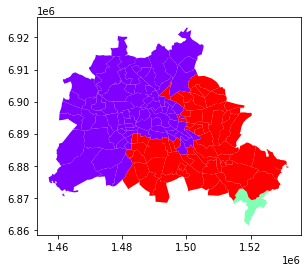

In [34]:
district.assign(labels=district_priceclusters_sp.labels_).plot('labels', cmap='rainbow')

<AxesSubplot:>

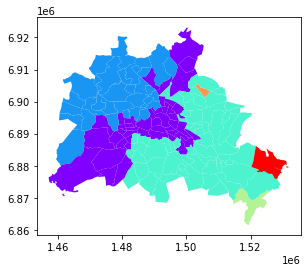

In [36]:
district_priceclusters_sp = skc.AgglomerativeClustering(n_clusters=6, connectivity=rook_graph.sparse).fit(district[['median_price']])
district.assign(labels=district_priceclusters_sp.labels_).plot('labels', cmap='rainbow')


## Probabilistic clustering

In [37]:
import sklearn.mixture as skmix

In [38]:
gmm = skmix.GaussianMixture(n_components=3, random_state=7052018).fit(district[['median_price']])

In [42]:
predicted = gmm.predict(district[['median_price']])

In [45]:
strengths = gmm.predict_proba(district[['median_price']])

In [43]:
strengths[0:5]

array([[5.32248724e-01, 3.92263093e-02, 4.28524967e-01],
       [1.56665236e-03, 3.32706150e-01, 6.65727198e-01],
       [3.23917287e-02, 1.00564739e-01, 8.67043532e-01],
       [3.34902688e-22, 1.00000000e+00, 1.21678893e-10],
       [8.90592520e-01, 5.10683791e-02, 5.83391013e-02]])

In [46]:
strength = strengths.max(axis=1)

In [47]:
strength[0:5]

array([0.53224872, 0.6657272 , 0.86704353, 1.        , 0.89059252])

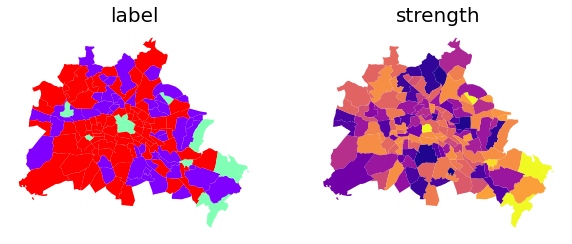

In [48]:
f, ax = plt.subplots(1, 2, figsize=(10, 4))
district.assign(labels=predicted).plot('labels', ax=ax[0], cmap='rainbow')
district.assign(strength=strength).plot('strength', ax=ax[1], cmap='plasma', vmin=.5, vmax=1)
for i in range(2):
  ax[i].axis('off')
  ax[i].set_title(['label', 'strength'][i], fontsize=20)

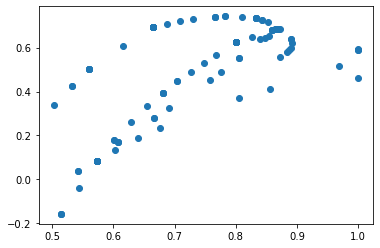

In [49]:
silhouettes_gmm = skm.silhouette_samples(district[['median_price']], predicted)
plt.scatter(strength, silhouettes_gmm)